1) Climatology / Gyre / Currents / Wind...

- moyenne globale / mars / septembre 
- tout l'Arctic / Detroit de Fram / Gyre Beaufort 
- wind / ocean / ice 
- coupe T° / S / density
- stream plot 
 

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmocean.cm as cmo
import cartopy.crs as ccrs
import gsw

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)


from utils import *

In [2]:
proj = ccrs.NorthPolarStereo()
proj_og = ccrs.PlateCarree()

In [3]:
ds = load_climatology_with_deptho()
lon = ds.longitude
lat = ds.latitude

In [4]:
ds3 = ds.sel(month=3)  # End of winter
ds9 = ds.sel(month=9)  # End of summer

In [5]:
ds_atm = load_atm_data()

In [6]:
# Group by month
ds_atm_grouped = ds_atm.groupby('time.month')
ds_atm3= ds_atm_grouped[3].mean('time')
ds_atm9 = ds_atm_grouped[9].mean('time')

# Vue d'au dessus

## Data 

### Ocean

In [7]:
U = ds['U'].sel(depth=slice(0, 200)).mean('depth').mean('month')
V = ds['V'].sel(depth= slice(0,200)).mean('depth').mean('month')
Mag = np.sqrt(U**2 + V**2)

U3 = ds3['U'].sel(depth=slice(0, 200)).mean('depth')
V3 = ds3['V'].sel(depth=slice(0, 200)).mean('depth')
Mag3 = np.sqrt(U3**2 + V3**2)

U9 = ds9['U'].sel(depth=slice(0, 200)).mean('depth')
V9 = ds9['V'].sel(depth=slice(0, 200)).mean('depth')
Mag9 = np.sqrt(U9**2 + V9**2)

### Ice

In [8]:
mask = ds.SIC > 0.1
mask3 = ds3.SIC > 0.1
mask9 = ds9.SIC > 0.1


Ice = ds.SIC.where(mask).mean('month')
Ice3 = ds3.SIC.where(mask3)
Ice9 = ds9.SIC.where(mask9)

### Temperature

In [9]:
T = ds.T.mean('month').isel(depth=0)
T3 = ds3.T.isel(depth=0)
T9 = ds9.T.isel(depth=0)

### Atmosphere

In [10]:
u10_3 = ds_atm3.u10
v10_3 = ds_atm3.v10
mag10_3 = np.sqrt(u10_3**2 + v10_3**2)
u10_9 = ds_atm3.u10
v10_9 = ds_atm3.v10
mag10_9 = np.sqrt(u10_9**2 + v10_9**2)


thresh = 0.01
sc = 50.
sh = 40

In [11]:
# Mask the continents using SSH
mask_continents3 = ds3.SSH.isnull()
mask_continents9 = ds9.SSH.isnull()

# Apply the mask to u10 and v10
u10_3_= u10_3.where(~mask_continents3)
v10_3_= v10_3.where(~mask_continents3)
mag10_3_ = mag10_3.where(~mask_continents3)

u10_9_= u10_9.where(~mask_continents9)
v10_9_= v10_9.where(~mask_continents9)
mag10_9_ = mag10_9.where(~mask_continents9)

## Ocean

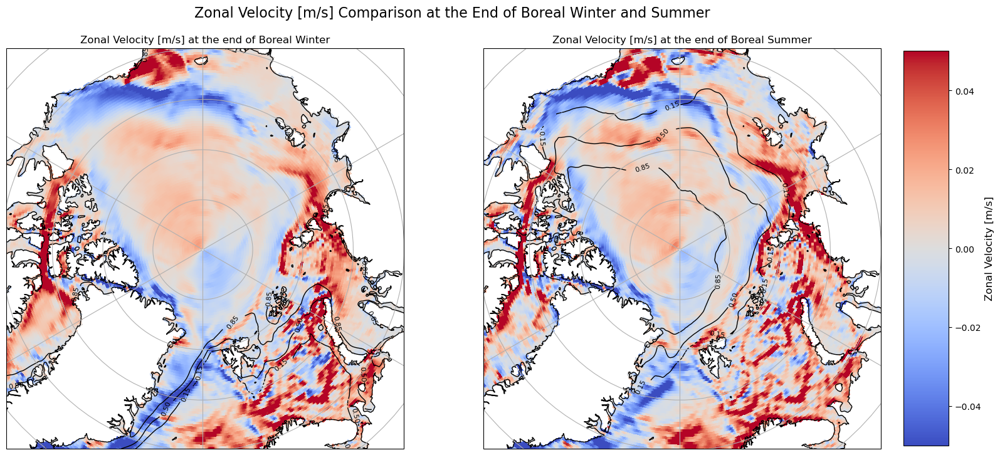

In [12]:
plot2(U3,U9,Ice3,Ice9,'coolwarm','k',-0.05,0.05, 'Zonal Velocity [m/s]')

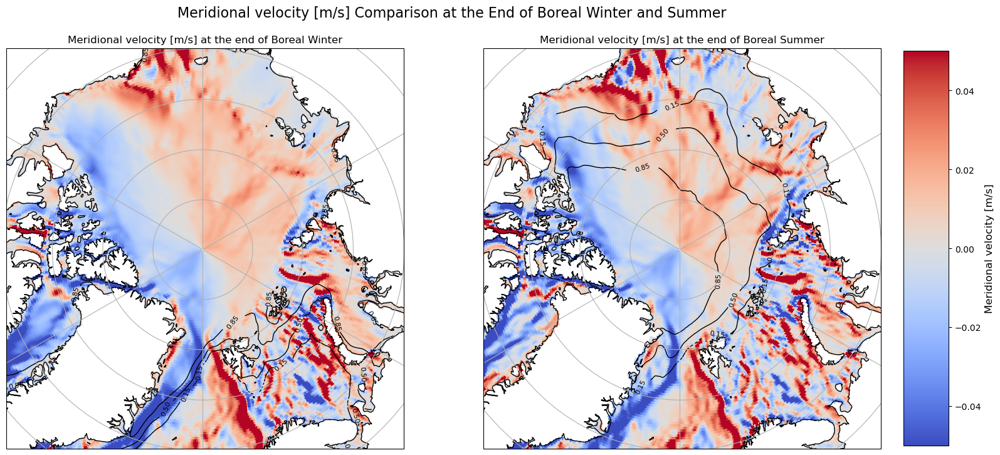

In [13]:
plot2(V3,V9,Ice3,Ice9,'coolwarm','k',-0.05,0.05, 'Meridional velocity [m/s]')

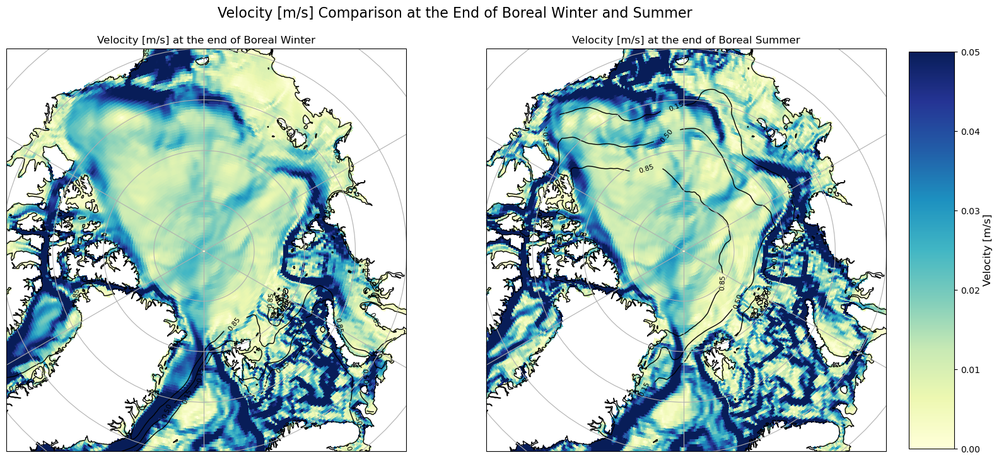

In [26]:
plot2(Mag3,Mag9,Ice3,Ice9,'YlGnBu','k',0,0.05, 'Velocity [m/s]')

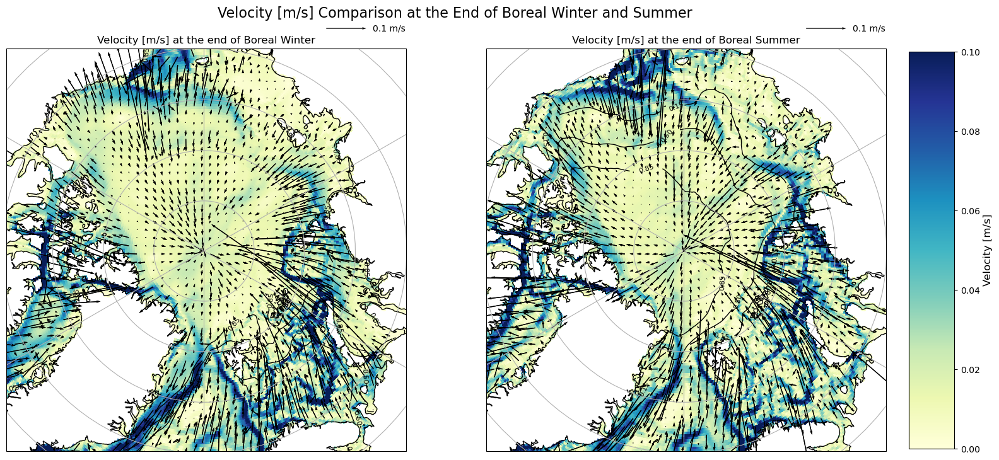

In [15]:

plot2quiv(Mag3,Mag9,Ice3,Ice9,'YlGnBu','k',0,0.1 , 'Velocity [m/s]',U3,V3,U9,V9, threshold=0, scale = 1)

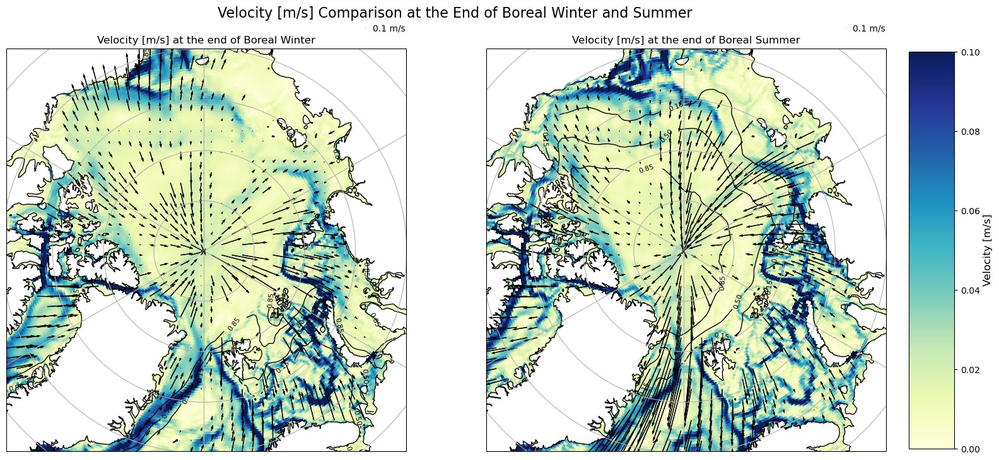

In [13]:
plot2quiv(Mag3, Mag9, Ice3, Ice9, 'YlGnBu', 'k', 0, 0.1, 'Velocity [m/s]', u10_3_, v10_3_, u10_9_, v10_9_, threshold=thresh, scale=sc, shape=sh)



## Sea ice 

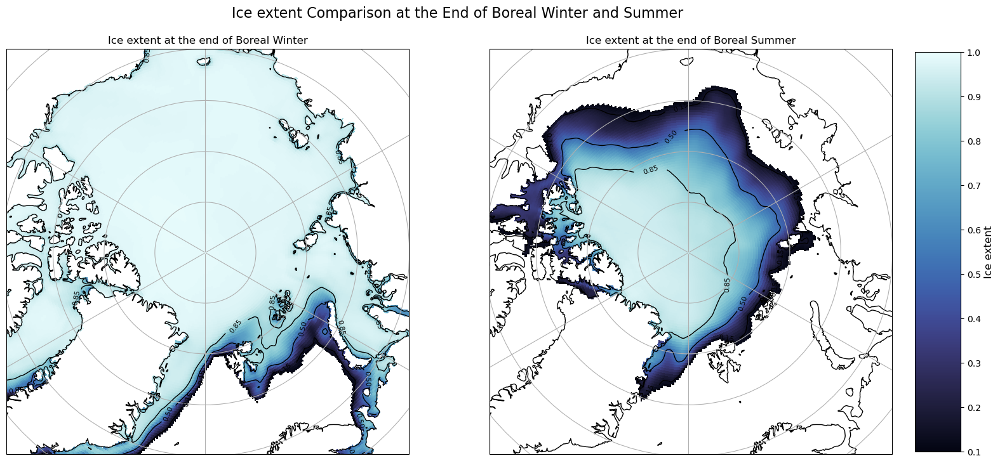

In [14]:
plot2(Ice3,Ice9,Ice3,Ice9,cmo.ice,'k',0.1,1, 'Ice extent')

## Temperature

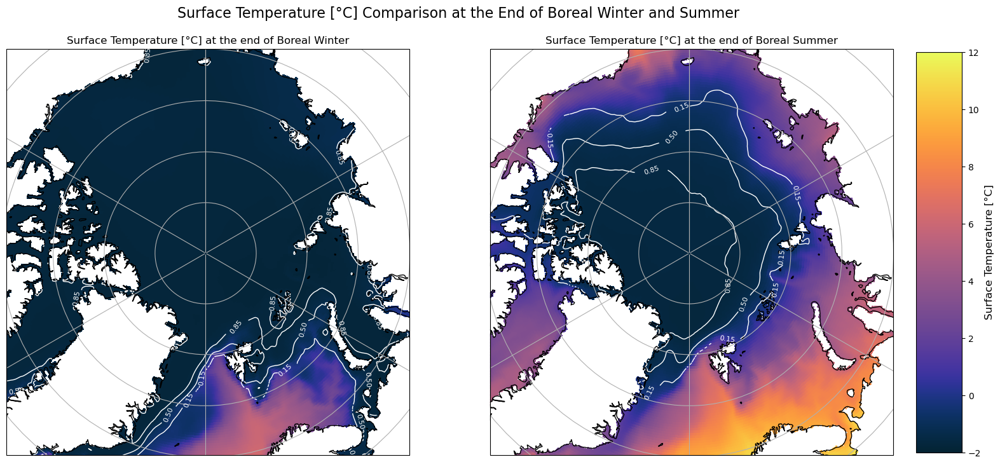

In [16]:
plot2(T3,T9,Ice3,Ice9,'cmo.thermal','white',-2,12, 'Surface Temperature [°C]')

## Atmosphere 

### Continents

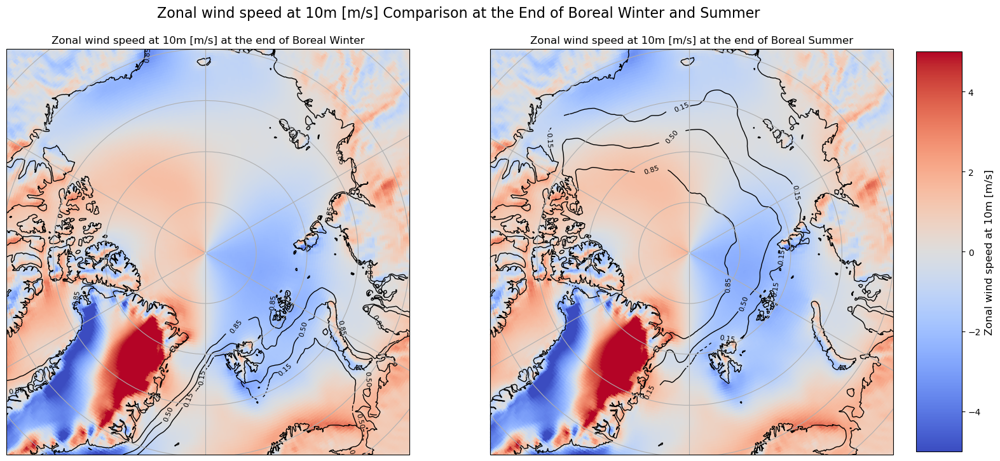

In [18]:
plot2(u10_3,u10_9, Ice3,Ice9,'coolwarm','k',-5,5, 'Zonal wind speed at 10m [m/s]')

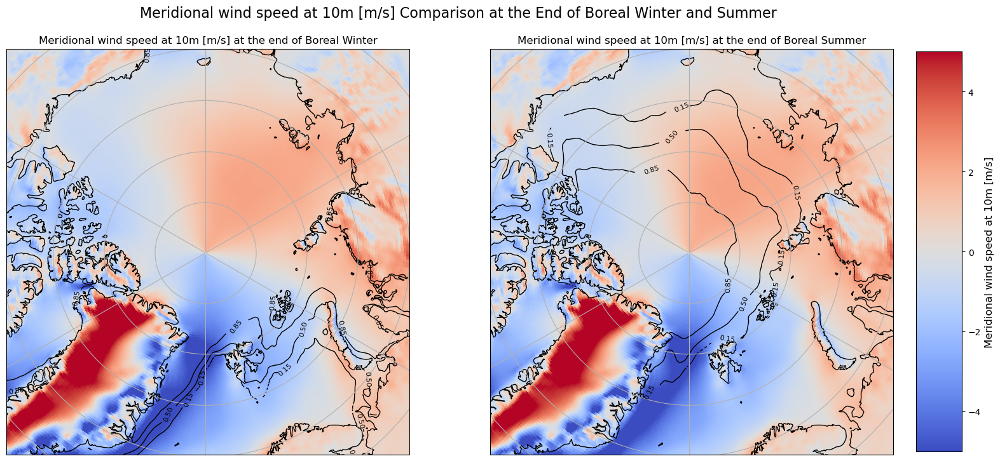

In [19]:
plot2(v10_3,v10_9, Ice3,Ice9,'coolwarm','k',-5,5, 'Meridional wind speed at 10m [m/s]')

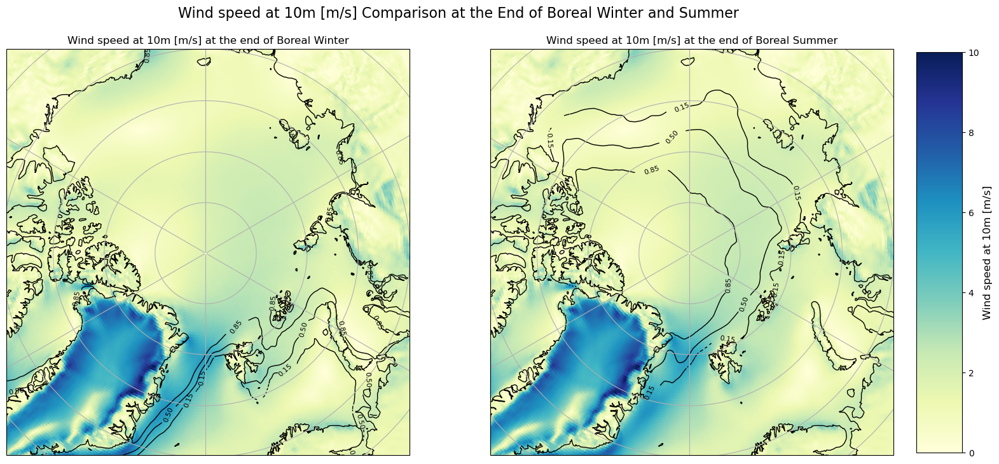

In [20]:
plot2(mag10_3,mag10_9, Ice3,Ice9,'YlGnBu','k',0,10, 'Wind speed at 10m [m/s]')

### Masked continents

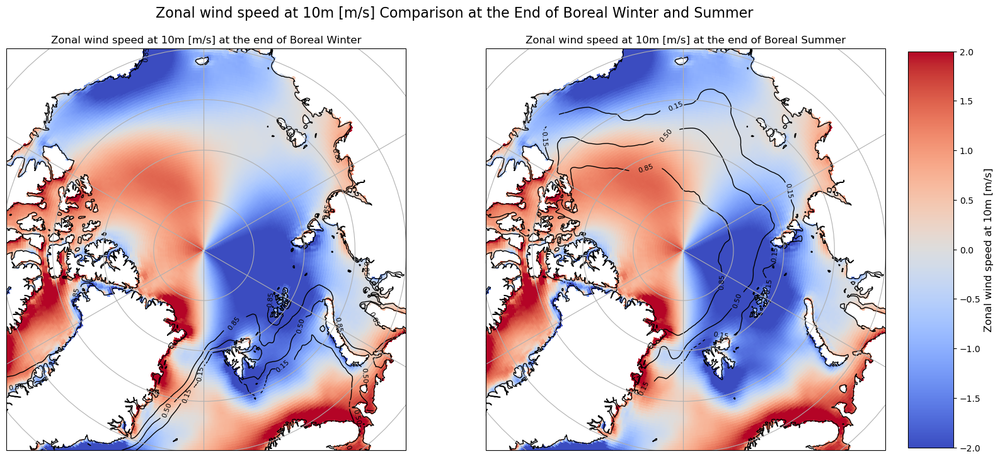

In [22]:
plot2(u10_3_,u10_9_, Ice3,Ice9,'coolwarm','k',-2,2, 'Zonal wind speed at 10m [m/s]')


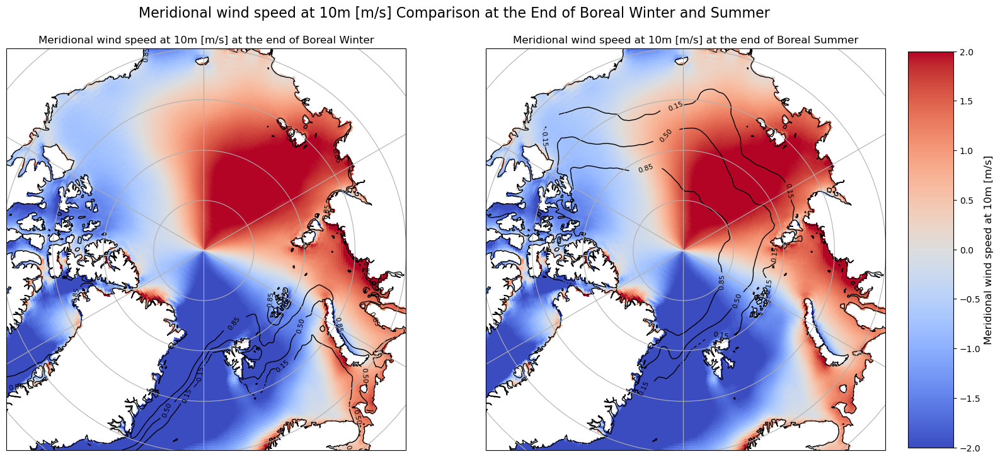

In [23]:
plot2(v10_3_,v10_9_, Ice3,Ice9,'coolwarm','k',-2,2, 'Meridional wind speed at 10m [m/s]')

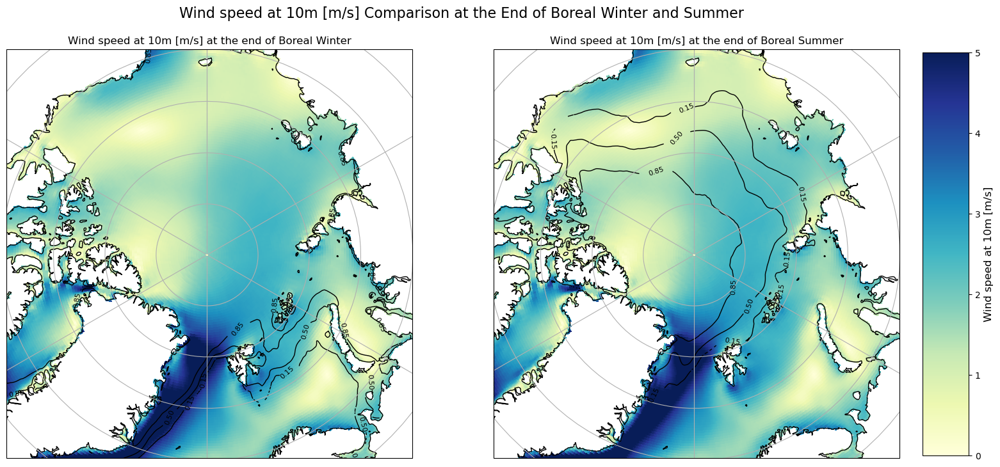

In [24]:
plot2(mag10_3_,mag10_9_, Ice3,Ice9,'YlGnBu','k',0,5, 'Wind speed at 10m [m/s]')


# Coupe

# Fuck around

In [17]:
def plot2test(Mar,Sept,contMar,contSept,colour1,colour2, vmin ,vmax, name, quiver = False, quivname = "ocean", extent = [-180,180, 70, 90] ) :   # masked = "ice"
    proj = ccrs.NorthPolarStereo()
    proj_og = ccrs.PlateCarree()     

    ds = load_climatology_with_deptho()
    lon = ds.longitude
    lat = ds.latitude 


    fig, ax = plt.subplots(1, 2, subplot_kw={'projection': proj}, figsize=(18, 18))

    # Flatten the axes array for easier iteration
    ax = ax.flatten()

    # Plot the first subplot
    pc = ax[0].pcolormesh(lon, lat, Mar, transform=proj_og, cmap=colour1, vmin = vmin, vmax = vmax)
    contour = ax[0].contour(lon, lat, contMar, levels=[0.15, 0.5, 0.85], colors=colour2, linewidths=1, transform=proj_og)
    ax[0].gridlines()
    ax[0].set_extent(extent, crs=proj_og)
    ax[0].set_title(f'{name} at the end of Boreal Winter')
    ax[0].coastlines()

    # Add quiver plot for the first subplot
    if quiver == True:
        if quivname == "ocean":
            threshold = 0.01
            U3ma =U3.where(Mar > threshold)
            V3ma =V3.where(Sept > threshold)
            U9ma =U9.where(Mar > threshold)
            V9ma =V9.where(Sept > threshold)
            scale =2
            shape = 50 
        else : 
            threshold = 0.01
            U3ma =u10_3_.where(Mar > threshold)
            V3ma =v10_3_.where(Sept > threshold)
            U9ma =u10_9_.where(Mar > threshold)
            V9ma =u10_9_.where(Sept > threshold)
            
            #if masked == "ice":
             ##   ice = 0.5
              #  U3ma =U3m.where(Ice3 < ice)
             #   V3ma =V3m.where(Ice3 < ice)
              #  U9ma =U9m.where(Ice9 < ice)
              #  V9ma =V9m.where(Ice9 < ice)
            
            scale = 40
            shape = 40

        ax[0].quiver(lon.values,lat.values, U3ma.values,V3ma.values, transform=proj_og, scale=scale, width=0.002, color='black',regrid_shape = shape)
        
    else :
        pass

    # Plot the second subplot
    pc = ax[1].pcolormesh(lon, lat, Sept, transform=proj_og, cmap=colour1, vmin = vmin, vmax = vmax)
    contour = ax[1].contour(lon, lat, contSept, levels=[0.15, 0.5, 0.85], colors=colour2, linewidths=1, transform=proj_og)
    ax[1].clabel(contour, inline=True, fontsize=8)
    ax[1].set_extent(extent, crs=proj_og)
    ax[1].set_title(f'{name} at the end of Boreal Summer')
    ax[1].coastlines()
    ax[1].gridlines()

    # Add quiver plot for the second subplot
    if quiver == True:
        ax[1].quiver(lon.values, lat.values, U9ma.values, V9ma.values, transform=proj_og, scale=scale, width=0.002, color='black',regrid_shape =shape )
    else : 
        pass
    # Add a vector reference for the size
    plt.quiverkey(ax[0].quiver(lon, lat, U3ma, V3ma, transform=proj_og, scale=scale, width=0.002, color='black', regrid_shape=shape), 
                  X=0.9, Y=1.05, U=0.1, label='0.11 m/s', labelpos='E')
    plt.quiverkey(ax[1].quiver(lon, lat, U9ma, V9ma, transform=proj_og, scale=scale, width=0.002, color='black', regrid_shape=shape), 
                  X=0.9, Y=1.05, U=0.1, label='0.1 m/s', labelpos='E')

    # Define the position for the colorbar [left, bottom, width, height]
    cbar_ax = fig.add_axes([0.92, 0.42, 0.04, 0.3])  # Adjust these values as needed

    # Add the colorbar to the specified axes
    cbar = fig.colorbar(pc, cax=cbar_ax, orientation='vertical', label='Velocity [m/s]')
    cbar.set_label(f'{name}', fontsize=12)


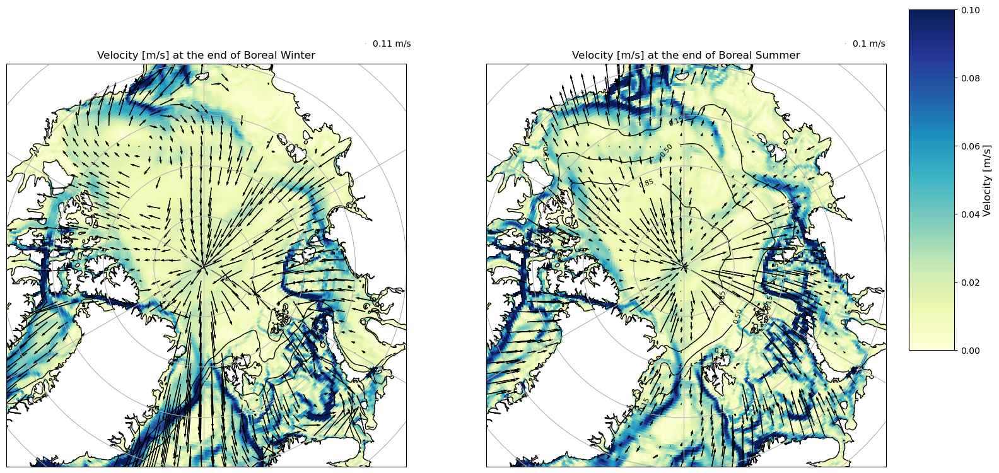

In [18]:
plot2test(Mag3,Mag9,Ice3,Ice9,'YlGnBu','k',0,0.1, 'Velocity [m/s]', quiver = True, quivname = "atm", extent = [-180,180, 70, 90] )

In [37]:

def plottest(Mar,Sept,contMar,contSept,colour1,colour2, vmin ,vmax, name, extent = [-180,180, 70, 90] ):
    proj = ccrs.NearsidePerspective(180,50)
    proj_og = ccrs.PlateCarree()     

    ds = load_climatology_with_deptho()
    lon = ds.longitude
    lat = ds.latitude  
    # plot pour la fin d'hivers et la fin d'été vue d'en haut 

    fig, ax = plt.subplots(1, 2, subplot_kw={'projection': proj}, figsize=(18, 18))

    # Flatten the axes array for easier iteration
    ax = ax.flatten()

    # Plot the first subplot
    pc = ax[0].pcolormesh(lon, lat, Mar, transform=proj_og, cmap=colour1, vmin = vmin, vmax = vmax)
    contour = ax[0].contour(lon, lat, contMar, levels=[0.15, 0.5, 0.85], colors=colour2, linewidths=1, transform=proj_og)
    ax[0].gridlines()
    #ax[0].set_extent(extent, crs=proj_og)
    ax[0].set_title(f'{name} at the end of Boreal Winter')
    ax[0].coastlines()

    # Plot the second subplot
    pc = ax[1].pcolormesh(lon, lat, Sept, transform=proj_og, cmap=colour1, vmin = vmin, vmax = vmax)
    contour = ax[1].contour(lon, lat, contSept, levels=[0.15, 0.5, 0.85], colors=colour2, linewidths=1, transform=proj_og)
    ax[1].clabel(contour, inline=True, fontsize=8)
   # ax[1].set_extent(extent, crs=proj_og)
    ax[1].set_title(f'{name} at the end of Boreal Summer')
    ax[1].coastlines()
    ax[1].gridlines()

    # Define the position for the colorbar [left, bottom, width, height]
    cbar_ax = fig.add_axes([0.92, 0.42, 0.04, 0.3])  # Adjust these values as needed

    # Add the colorbar to the specified axes
    cbar = fig.colorbar(pc, cax=cbar_ax, orientation='vertical', label='Velocity [m/s]')
    cbar.set_label(f'{name}', fontsize=12)

    plt.show()

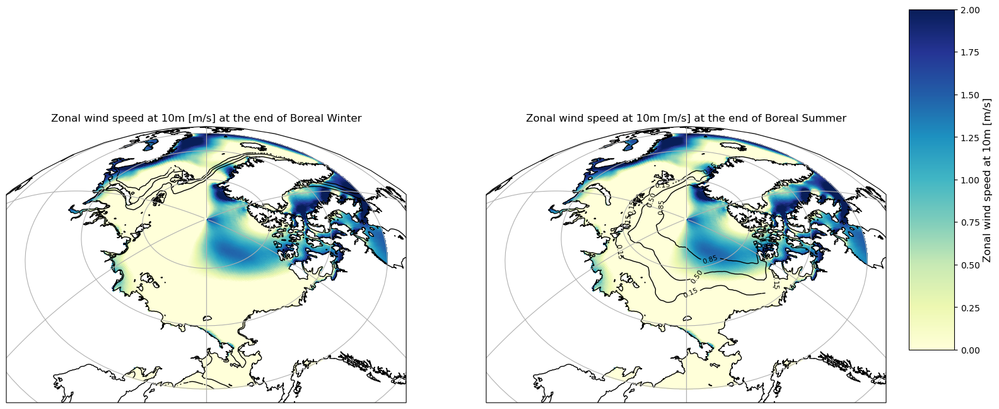

In [ ]:
plottest(u10_3_,u10_9_, Ice3,Ice9,'YlGnBu','k',0,2, 'Zonal wind speed at 10m [m/s]')

In [ ]:
def plottesttest(Mar,Sept,contMar,contSept,colour1,colour2, vmin ,vmax, name, extent = [-180,180, 70, 90] , quiver = False):
    proj = ccrs.NorthPolarStereo()
    proj_og = ccrs.PlateCarree()     

    ds = load_climatology_with_deptho()
    lon = ds.longitude
    lat = ds.latitude  
    # plot pour la fin d'hivers et la fin d'été vue d'en haut 

    fig, ax = plt.subplots(1, 2, subplot_kw={'projection': proj}, figsize=(18, 18))

    # Flatten the axes array for easier iteration
    ax = ax.flatten()

    # Plot the first subplot
    pc = ax[0].pcolormesh(lon, lat, Mar, transform=proj_og, cmap=colour1, vmin = vmin, vmax = vmax)
    contour = ax[0].contour(lon, lat, contMar, levels=[0.15, 0.5, 0.85], colors=colour2, linewidths=1, transform=proj_og)
    ax[0].gridlines()
    #ax[0].set_extent(extent, crs=proj_og)
    ax[0].set_title(f'{name} at the end of Boreal Winter')
    ax[0].coastlines()
    '''
    if quiver == True :
        if Mar == u10_3_ :
            ax[0].quiver(lon,lat, u10_3, v10_3, transform=proj_og, scale=50, width=0.002, color='black')
    else  :
        pass
    '''
    # Plot the second subplot
    pc = ax[1].pcolormesh(lon, lat, Sept, transform=proj_og, cmap=colour1, vmin = vmin, vmax = vmax)
    contour = ax[1].contour(lon, lat, contSept, levels=[0.15, 0.5, 0.85], colors=colour2, linewidths=1, transform=proj_og)
    ax[1].clabel(contour, inline=True, fontsize=8)
   # ax[1].set_extent(extent, crs=proj_og)
    ax[1].set_title(f'{name} at the end of Boreal Summer')
    ax[1].coastlines()
    ax[1].gridlines()

    '''
    if quiver == True :
        ax[1].quiver(lon, lat, u10_9, v10_9, transform=proj_og, scale=50, width=0.002, color='black')
    else  :
        pass
    '''
    
    fig.suptitle(f'{name} Comparison at the End of Boreal Winter and Summer', fontsize=16,x = 0.52, y = 0.71)
    
    # Define the position for the colorbar [left, bottom, width, height]
    cbar_ax = fig.add_axes([0.92, 0.32, 0.04, 0.35])  # Adjust these values as needed

    # Add the colorbar to the specified axes
    cbar = fig.colorbar(pc, cax=cbar_ax, orientation='vertical', label='Velocity [m/s]')
    cbar.set_label(f'{name}', fontsize=12)

    plt.show()

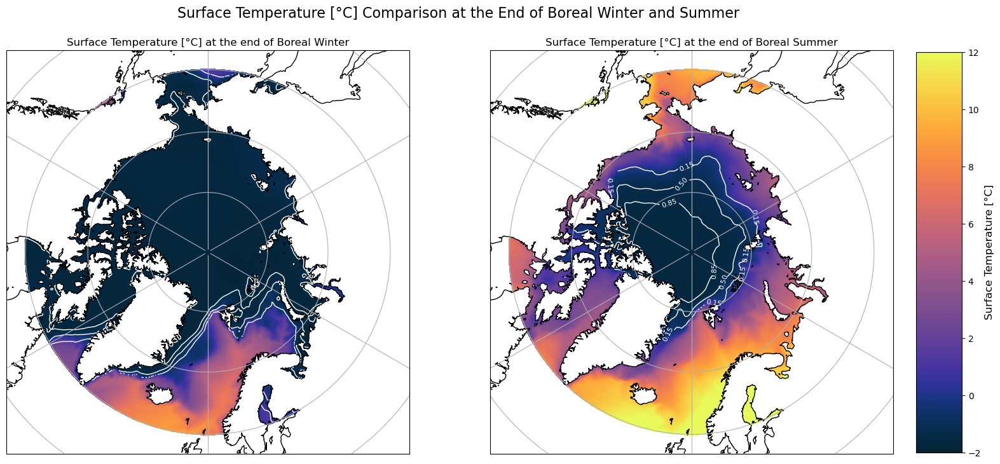

In [97]:
plottesttest(T3,T9,Ice3,Ice9,'cmo.thermal','white',-2,12, 'Surface Temperature [°C]')